#convert P2 to .ipynb use Visium Code

In [1]:
import sys
sys.path.append('/gpfs/commons/groups/innovation/jjoseph/smurf_results/SMURF')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import scanpy as sc
import anndata

import smurf as su

import pickle
import copy
import gzip
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import anndata
import geopandas as gpd
import scanpy as sc

from tifffile import imread, imwrite
from csbdeep.utils import normalize
from stardist.models import StarDist2D
from shapely.geometry import Polygon, Point
from scipy import sparse
from matplotlib.colors import ListedColormap

%matplotlib inline
%config InlineBackend.figure_format = 'retina'


2025-07-28 11:13:45.543716: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI AVX512_BF16 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-07-28 11:13:47.293810: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-07-28 11:13:48.585748: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-28 11:13:57.571223: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvi

In [2]:
# General image plotting functions
def plot_mask_and_save_image(title, gdf, img, cmap, output_name=None, bbox=None):
    if bbox is not None:
        # Crop the image to the bounding box
        cropped_img = img[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    else:
        cropped_img = img

    # Plot options
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plot the cropped image
    axes[0].imshow(cropped_img, cmap='gray', origin='lower')
    axes[0].set_title(title)
    axes[0].axis('off')

    # Create filtering polygon
    if bbox is not None:
        bbox_polygon = Polygon([(bbox[0], bbox[1]), (bbox[2], bbox[1]), (bbox[2], bbox[3]), (bbox[0], bbox[3])])
        # Filter for polygons in the box
        intersects_bbox = gdf['geometry'].intersects(bbox_polygon)
        filtered_gdf = gdf[intersects_bbox]
    else:
        filtered_gdf=gdf

    # Plot the filtered polygons on the second axis
    filtered_gdf.plot(cmap=cmap, ax=axes[1])
    axes[1].axis('off')
    axes[1].legend(loc='upper left', bbox_to_anchor=(1.05, 1))


    # Save the plot if output_name is provided
    if output_name is not None:
        plt.savefig(output_name, bbox_inches='tight')  # Use bbox_inches='tight' to include the legend
    else:
        plt.show()

def plot_gene_and_save_image(title, gdf, gene, img, adata, bbox=None, output_name=None):

    if bbox is not None:
        # Crop the image to the bounding box
        cropped_img = img[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    else:
        cropped_img = img

    # Plot options
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plot the cropped image
    axes[0].imshow(cropped_img, cmap='gray', origin='lower')
    axes[0].set_title(title)
    axes[0].axis('off')

    # Create filtering polygon
    if bbox is not None:
        bbox_polygon = Polygon([(bbox[0], bbox[1]), (bbox[2], bbox[1]), (bbox[2], bbox[3]), (bbox[0], bbox[3])])


    # Find a gene of interest and merge with the geodataframe
    gene_expression = adata[:, gene].to_df()
    gene_expression['id'] = gene_expression.index
    merged_gdf = gdf.merge(gene_expression, left_on='id', right_on='id')

    if bbox is not None:
        # Filter for polygons in the box
        intersects_bbox = merged_gdf['geometry'].intersects(bbox_polygon)
        filtered_gdf = merged_gdf[intersects_bbox]
    else:
        filtered_gdf = merged_gdf

    # Plot the filtered polygons on the second axis
    filtered_gdf.plot(column=gene, cmap='inferno', legend=True, ax=axes[1])
    axes[1].set_title(gene)
    axes[1].axis('off')
    axes[1].legend(loc='upper left', bbox_to_anchor=(1.05, 1))

    # Save the plot if output_name is provided
    if output_name is not None:
        plt.savefig(output_name, bbox_inches='tight')  # Use bbox_inches='tight' to include the legend
    else:
        plt.show()

def plot_clusters_and_save_image(title, gdf, img, adata, bbox=None, color_by_obs=None, output_name=None, color_list=None):
    color_list=["#7f0000","#808000","#483d8b","#008000","#bc8f8f","#008b8b","#4682b4","#000080","#d2691e","#9acd32","#8fbc8f","#800080","#b03060","#ff4500","#ffa500","#ffff00","#00ff00","#8a2be2","#00ff7f","#dc143c","#00ffff","#0000ff","#ff00ff","#1e90ff","#f0e68c","#90ee90","#add8e6","#ff1493","#7b68ee","#ee82ee"]
    if bbox is not None:
        cropped_img = img[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    else:
        cropped_img = img

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(cropped_img, cmap='gray', origin='lower')
    axes[0].set_title(title)
    axes[0].axis('off')

    if bbox is not None:
        bbox_polygon = Polygon([(bbox[0], bbox[1]), (bbox[2], bbox[1]), (bbox[2], bbox[3]), (bbox[0], bbox[3])])

    unique_values = adata.obs[color_by_obs].astype('category').cat.categories
    num_categories = len(unique_values)

    if color_list is not None and len(color_list) >= num_categories:
        custom_cmap = ListedColormap(color_list[:num_categories], name='custom_cmap')
    else:
        # Use default tab20 colors if color_list is insufficient
        tab20_colors = plt.cm.tab20.colors[:num_categories]
        custom_cmap = ListedColormap(tab20_colors, name='custom_tab20_cmap')

    merged_gdf = gdf.merge(adata.obs[color_by_obs].astype('category'), left_on='id', right_index=True)

    if bbox is not None:
        intersects_bbox = merged_gdf['geometry'].intersects(bbox_polygon)
        filtered_gdf = merged_gdf[intersects_bbox]
    else:
        filtered_gdf = merged_gdf

    # Plot the filtered polygons on the second axis
    plot = filtered_gdf.plot(column=color_by_obs, cmap=custom_cmap, ax=axes[1], legend=True)
    axes[1].set_title(color_by_obs)
    legend = axes[1].get_legend()
    legend.set_bbox_to_anchor((1.05, 1))
    axes[1].axis('off')

    # Move legend outside the plot
    plot.get_legend().set_bbox_to_anchor((1.25, 1))

    if output_name is not None:
        plt.savefig(output_name, bbox_inches='tight')
    else:
        plt.show()

# Plotting function for nuclei area distribution
def plot_nuclei_area(gdf,area_cut_off):
    fig, axs = plt.subplots(1, 2, figsize=(15, 4))
    # Plot the histograms
    axs[0].hist(gdf['area'], bins=50, edgecolor='black')
    axs[0].set_title('Nuclei Area')

    axs[1].hist(gdf[gdf['area'] < area_cut_off]['area'], bins=50, edgecolor='black')
    axs[1].set_title('Nuclei Area Filtered:'+str(area_cut_off))

    plt.tight_layout()
    plt.show()

# Total UMI distribution plotting function
def total_umi(adata_, cut_off):
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))

    # Box plot
    axs[0].boxplot(adata_.obs["total_counts"], vert=False, widths=0.7, patch_artist=True, boxprops=dict(facecolor='skyblue'))
    axs[0].set_title('Total Counts')

    # Box plot after filtering
    axs[1].boxplot(adata_.obs["total_counts"][adata_.obs["total_counts"] > cut_off], vert=False, widths=0.7, patch_artist=True, boxprops=dict(facecolor='skyblue'))
    axs[1].set_title('Total Counts > ' + str(cut_off))

    # Remove y-axis ticks and labels
    for ax in axs:
        ax.get_yaxis().set_visible(False)

    plt.tight_layout()
    plt.show()


In [3]:
!which python

import numpy
print("NumPy version:", numpy.__version__)

import tensorflow as tf
print("TensorFlow GPUs:", tf.config.list_physical_devices('GPU'))

import torch
print("CUDA available (PyTorch):", torch.cuda.is_available())
if torch.cuda.is_available():
    print("Device name:", torch.cuda.get_device_name(0))


/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/bin/python
NumPy version: 1.26.4
TensorFlow GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
CUDA available (PyTorch): True
Device name: NVIDIA L40S


In [9]:
so = su.prepare_dataframe_image('/gpfs/commons/groups/innovation/jjoseph/data/P5_CRC/binned_outputs/square_002um/spatial/tissue_positions.parquet',
                                '/gpfs/commons/groups/innovation/jjoseph/data/P5_CRC/inputs/Visium_HD_Human_Colon_Cancer_P5_tissue_image.btf',
                               'HE')

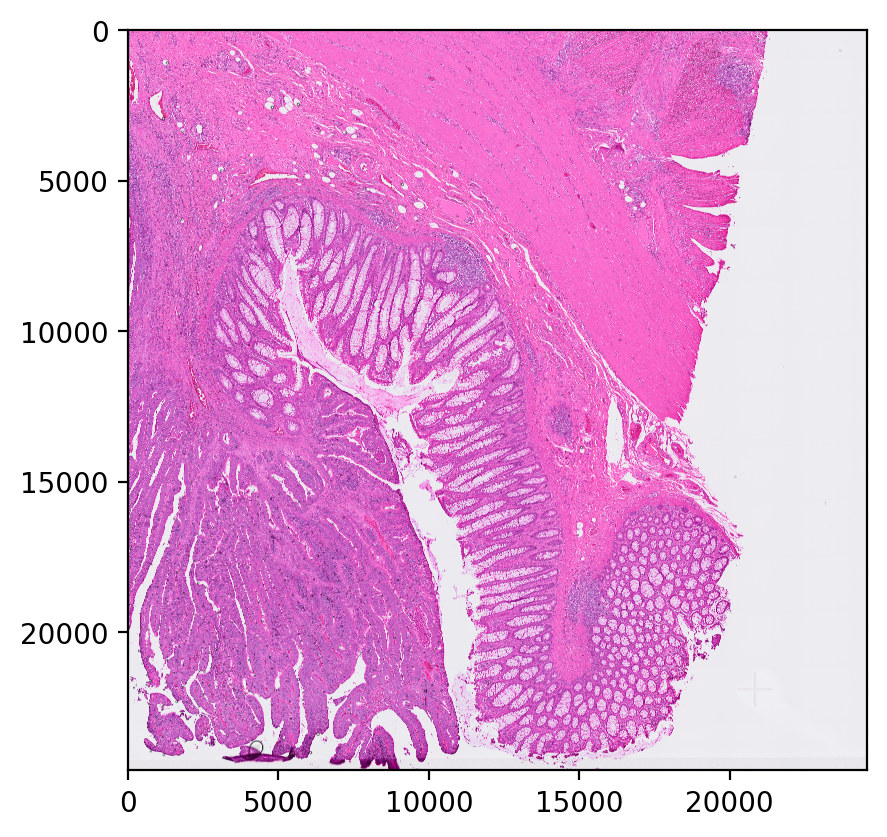

In [10]:
plt.imshow(so.image_temp())
plt.show()
plt.close()

In [11]:
# Load the image file
# Change dir_base as needed to the directory where the downloaded example data is stored
img = so.image_temp()

# Load the pretrained model
model = StarDist2D.from_pretrained('2D_versatile_he')

# Percentile normalization of the image
# Adjust min_percentile and max_percentile as needed
min_percentile = 5
max_percentile = 95
img = normalize(img, min_percentile, max_percentile)



Found model '2D_versatile_he' for 'StarDist2D'.


2025-07-25 12:05:17.033204: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI AVX512_BF16 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-07-25 12:05:17.110972: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43622 MB memory:  -> device: 0, name: NVIDIA L40S, pci bus id: 0000:05:00.0, compute capability: 8.9


Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.


In [12]:
# Predict cell nuclei using the normalized image
# Adjust nms_thresh and prob_thresh as needed
# using CPU cause GPU not wokring
import tensorflow as tf

with tf.device('/CPU:0'):
    labels, polys = model.predict_instances_big(
        img,
        axes='YXC',
        block_size=1024,
        prob_thresh=0.01,
        nms_thresh=0.001,
        min_overlap=128,
        context=128,
        normalizer=None,
        n_tiles=(4, 4, 1)
    )


effective: block_size=(1024, 1024, 3), min_overlap=(128, 128, 0), context=(128, 128, 0)


100%|██████████| 1444/1444 [25:21<00:00,  1.05s/it]


In [13]:
print(img.shape)

(24572, 24573, 3)


In [14]:
np.save("segmentation_final_p5_visium_07_25_25.npy", labels)

In [15]:
out_path = "/gpfs/commons/groups/innovation/jjoseph/smurf_results/segmentation_final_p5_visium_07_25_25.npy"
so.segmentation_final = np.load(out_path)

print("Segmentation shape:", so.segmentation_final.shape)
print("Image temp shape:", so.image_temp().shape)


Segmentation shape: (24572, 24573)
Image temp shape: (24572, 24573, 3)


In [16]:
print("labels shape:", labels.shape)
print("image_temp shape:", so.image_temp().shape)


labels shape: (24572, 24573)
image_temp shape: (24572, 24573, 3)


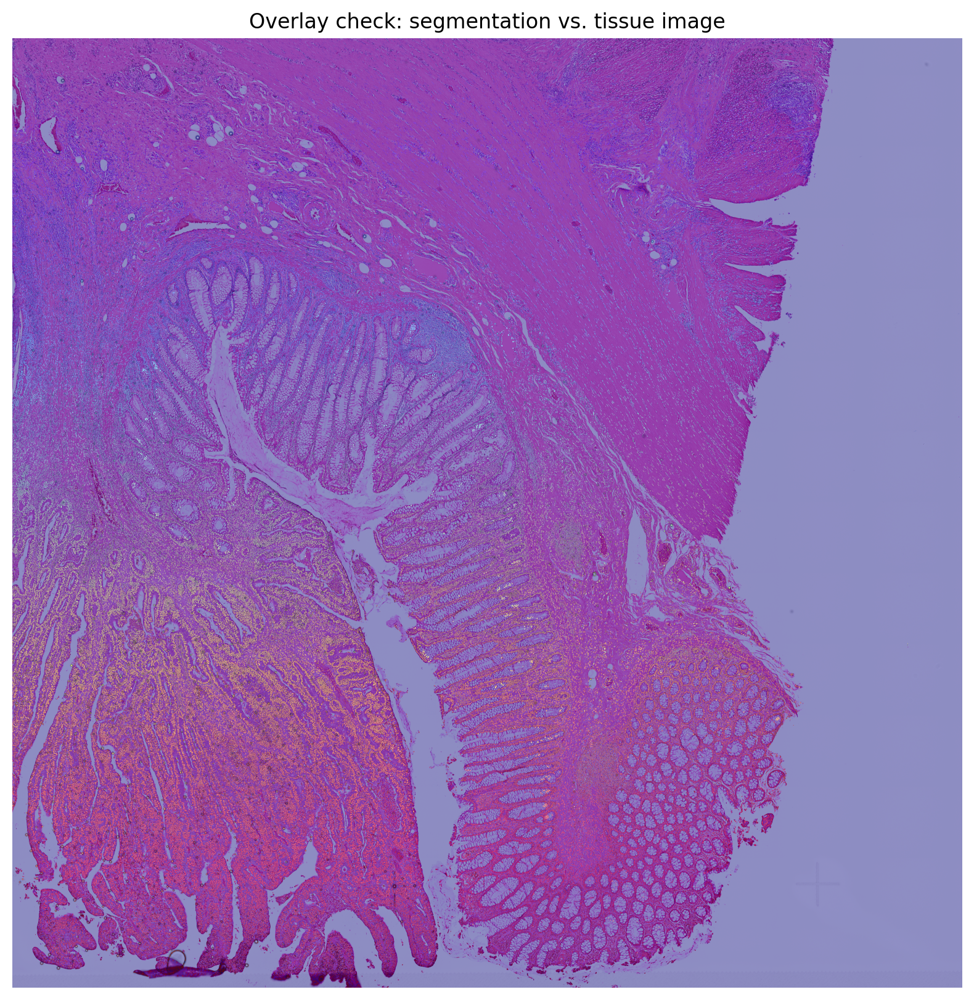

In [17]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
plt.imshow(so.image_temp())
plt.imshow(labels, cmap='jet', alpha=0.4)  # overlay
plt.title("Overlay check: segmentation vs. tissue image")
plt.axis('off')
plt.show()


In [ ]:
# Check image conversion to see if stardist labels and su image will match 

In [18]:
out_path = "/gpfs/commons/groups/innovation/jjoseph/smurf_results/segmentation_final_p5_visium_07_25_25.npy"
so.segmentation_final = np.load(out_path)

In [19]:
so.generate_cell_spots_information()

Generating cells information.


100%|██████████| 24572/24572 [09:16<00:00, 44.15it/s]


Generating spots information.


100%|██████████| 24572/24572 [02:43<00:00, 150.60it/s]


Filtering cells
We have 267449 nuclei in total.
Creating NN network


In [20]:
import scanpy as sc
import copy

# Adjust the path to your dataset
adata = sc.read_10x_mtx(
    '/gpfs/commons/groups/innovation/jjoseph/data/P5_CRC/binned_outputs/square_002um/filtered_feature_bc_matrix'
)

# Keep only barcodes that are within the tissue region (so.df has barcode info)
adata = copy.deepcopy(adata[so.df[so.df.in_tissue == 1]['barcode']])


In [21]:
sc.pp.filter_genes(adata, min_counts=1000)

In [22]:
su.nuclei_rna(adata,so)
adata_sc = copy.deepcopy(so.final_nuclei)
adata_sc

100%|██████████| 267449/267449 [03:22<00:00, 1320.32it/s]


AnnData object with n_obs × n_vars = 267449 × 12291
    var: 'gene_ids', 'feature_types'

In [23]:
sc.pp.filter_cells(adata_sc, min_counts=5)
adata_raw = copy.deepcopy(adata_sc)
adata_raw

AnnData object with n_obs × n_vars = 263532 × 12291
    obs: 'n_counts'
    var: 'gene_ids', 'feature_types'

In [24]:
adata_raw = copy.deepcopy(adata_sc)

Starting mt
Starting normalization
Starting PCA
Starting UMAP


auto.py (21): IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


Starting Clustering


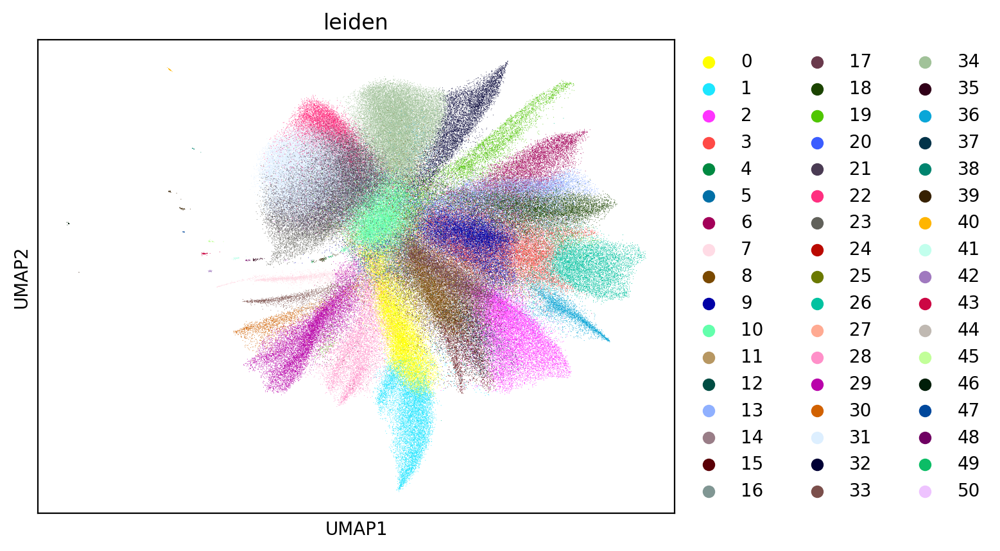

In [25]:
adata_sc = su.singlecellanalysis(adata_sc,resolution=2)

100%|██████████| 263532/263532 [03:19<00:00, 1322.79it/s]


Starting mt
Starting normalization
Starting PCA
Starting UMAP
Starting Clustering


saving figure to file figures/umap1_umap.png


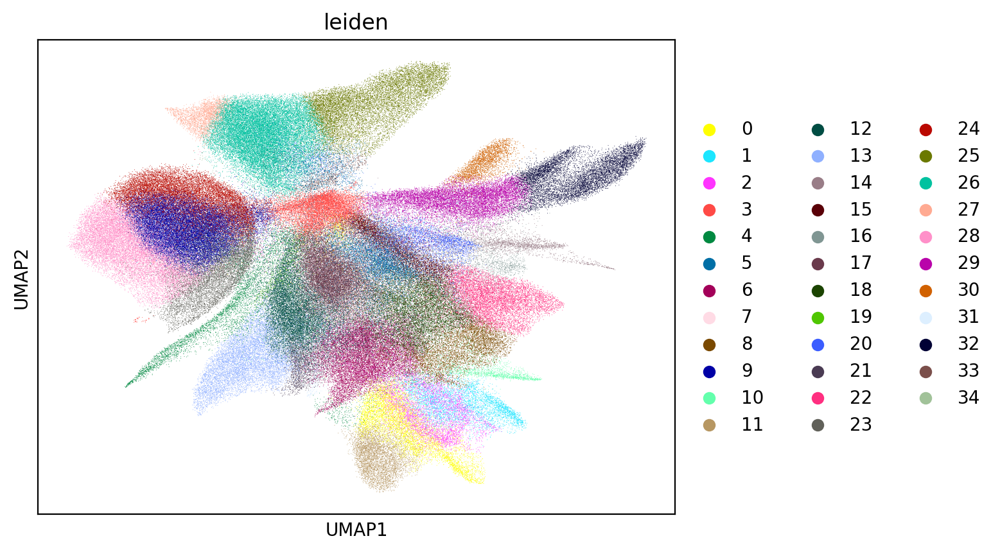

0.5024478353556059 1


100%|██████████| 263532/263532 [03:14<00:00, 1351.69it/s]


Starting mt
Starting normalization
Starting PCA
Starting UMAP
Starting Clustering


saving figure to file figures/umap2_umap.png


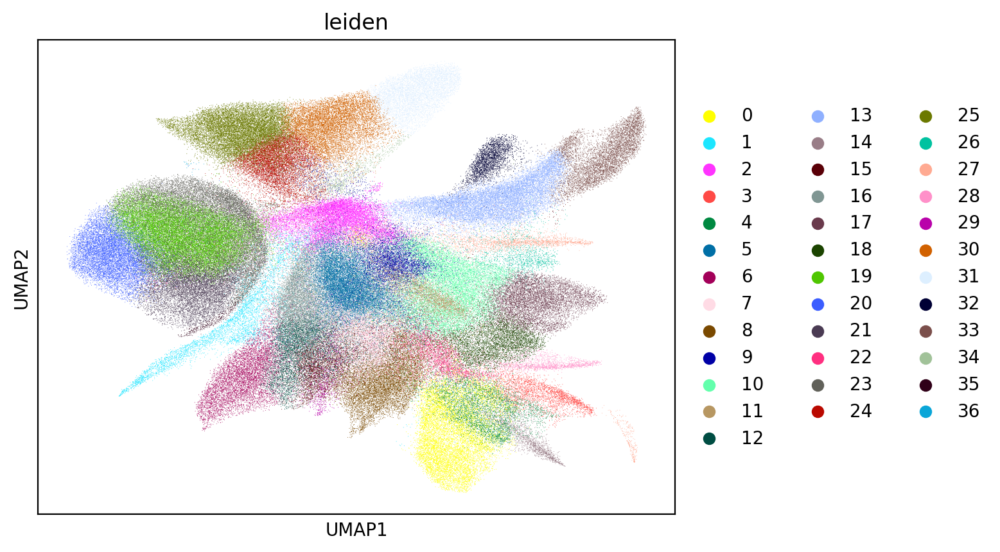

0.7115411857686061 2


100%|██████████| 263532/263532 [03:13<00:00, 1359.85it/s]


Starting mt
Starting normalization
Starting PCA
Starting UMAP
Starting Clustering


saving figure to file figures/umap3_umap.png


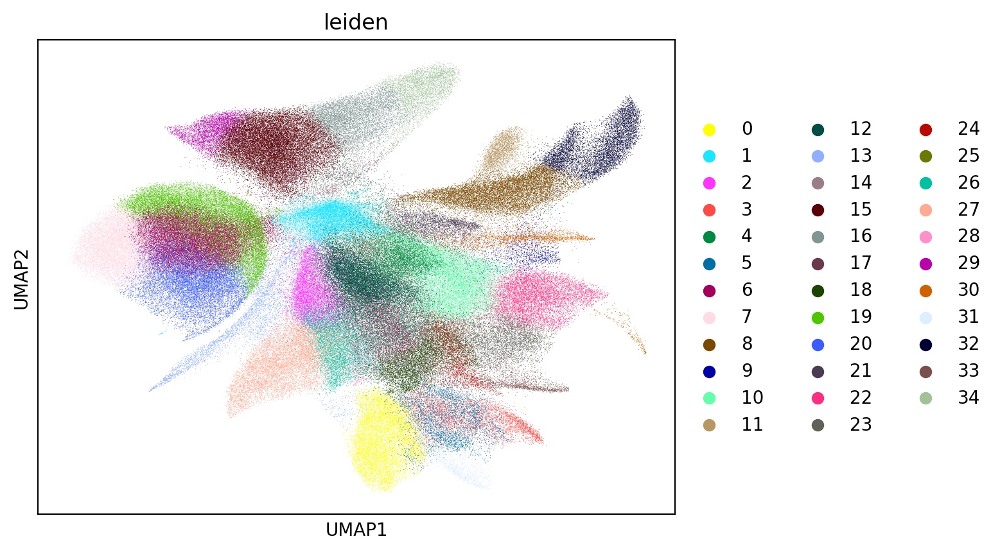

0.7518160220266255 3


100%|██████████| 263532/263532 [03:13<00:00, 1361.33it/s]


Starting mt
Starting normalization
Starting PCA
Starting UMAP
Starting Clustering


saving figure to file figures/umap4_umap.png


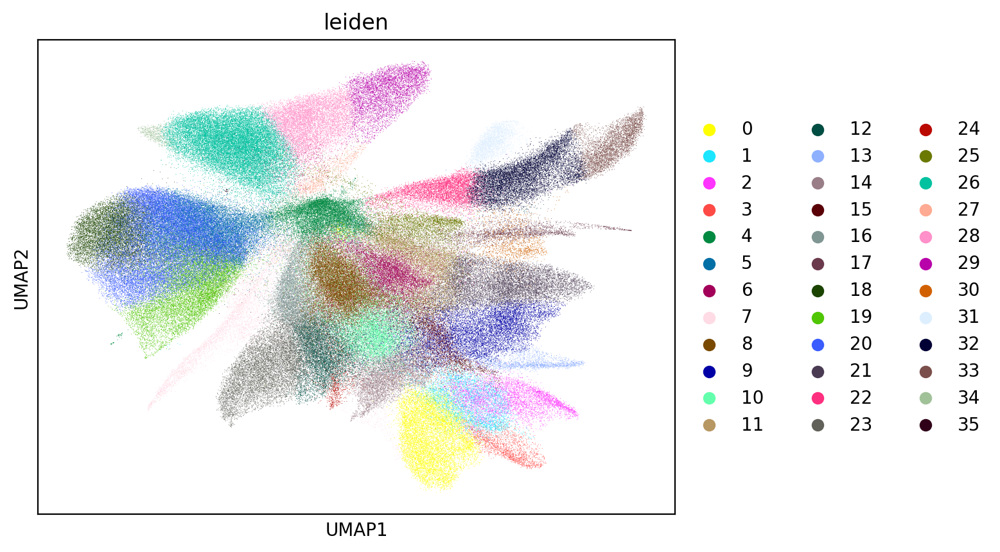

0.765193304431667 4


100%|██████████| 263532/263532 [03:15<00:00, 1347.56it/s]


Starting mt
Starting normalization
Starting PCA
Starting UMAP
Starting Clustering


saving figure to file figures/umap5_umap.png


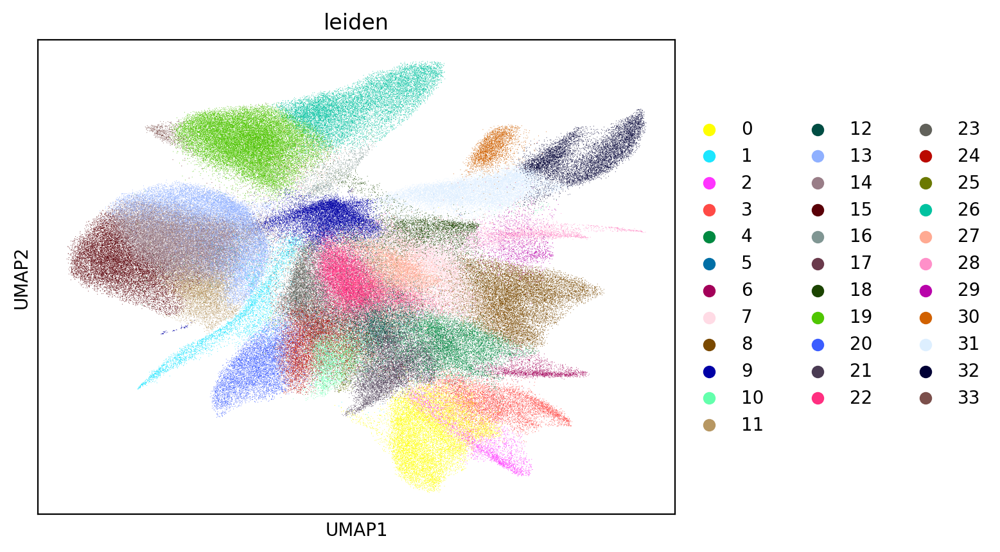

0.7514245716867425 5


100%|██████████| 263532/263532 [03:14<00:00, 1356.84it/s]


Starting mt
Starting normalization
Starting PCA
Starting UMAP
Starting Clustering


saving figure to file figures/umap6_umap.png


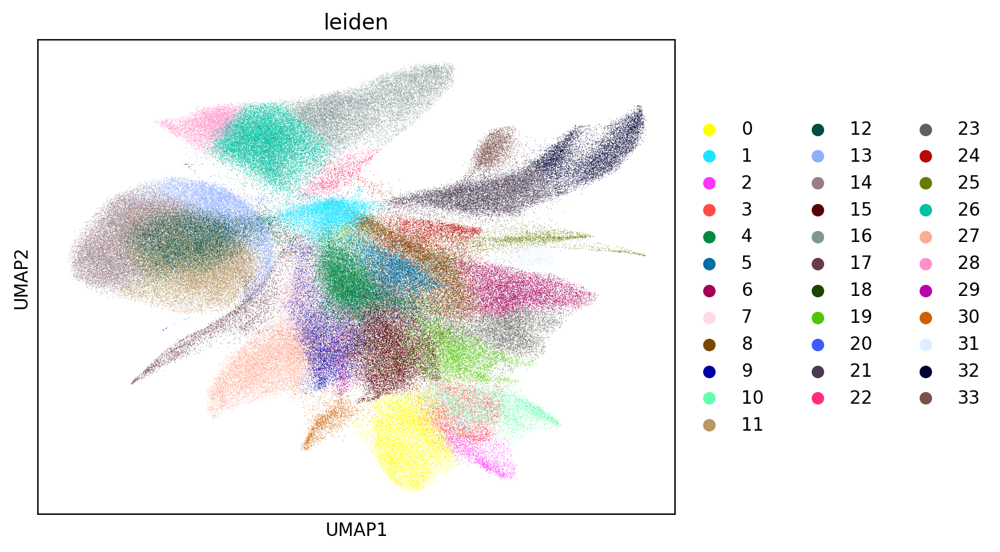

0.7511553845700943 6


In [27]:
import os
import pickle
import scanpy as sc
import smurf as su

# Define save folder
save_folder = "/gpfs/commons/groups/innovation/jjoseph/smurf_results/smurf_p5_interactive_07_25/"
os.makedirs(save_folder, exist_ok=True)

# Save input data 
sc.write(os.path.join(save_folder, "adata.h5ad"), adata)
sc.write(os.path.join(save_folder, "adata_sc.h5ad"), adata_sc)
sc.write(os.path.join(save_folder, "adata_raw.h5ad"), adata_raw)
with open(os.path.join(save_folder, "so.pkl"), "wb") as f:
    pickle.dump(so, f)

# Run SMURF with crash protection + resume support
try:
    su.itering_arragement(
        adata_sc,
        adata_raw,
        adata,
        so,
        resolution=2,
        save_folder=save_folder,
        show=True,          
        keep_previous=True    
    )
except Exception as e:
    print(f"SMURF crashed: {e}")


In [53]:
import scanpy as sc
import pickle
import smurf as su

save_folder = "/gpfs/commons/groups/innovation/jjoseph/smurf_results/smurf_p5_interactive_07_25/"

adata = sc.read_h5ad(save_folder + "adata.h5ad")
adata_sc = sc.read_h5ad(save_folder + "adata_sc.h5ad")
adata_raw = sc.read_h5ad(save_folder + "adata_raw.h5ad")

with open(save_folder + "so.pkl", "rb") as f:
    so = pickle.load(f)

su.itering_arragement(
    adata_sc,
    adata_raw,
    adata,
    so,
    resolution=2,
    save_folder=save_folder,
    show=True,
    keep_previous=True
)


KeyboardInterrupt



In [6]:
import os, glob, scanpy as sc
import os
import pickle
import scanpy as sc
import smurf as su

save_folder = "/gpfs/commons/groups/innovation/jjoseph/smurf_results/smurf_p5_interactive_07_25/"

def load_smurf_final(save_folder):
    """
    Return the AnnData from the SMURF iteration that finished with the
    highest MI.  If SMURF created the canonical 'adatas.h5ad' we load that;
    otherwise we load the most recent 'adatas_<n>.h5ad'.
    """
    canonical = os.path.join(save_folder, "adatas_ini_6.h5ad")
    if os.path.exists(canonical):
        print("Loading canonical file:", canonical)
        return sc.read_h5ad(canonical)

    # Fallback: pick the newest checkpoint
    candidates = sorted(
        glob.glob(os.path.join(save_folder, "adatas_*.h5ad")),
        key=os.path.getmtime
    )
    if not candidates:
        raise FileNotFoundError("No adatas_*.h5ad files found in " + save_folder)

    latest = candidates[-1]
    print("`adatas.h5ad` not found – loading newest checkpoint:", latest)
    return sc.read_h5ad(latest)

adatas_final = load_smurf_final(save_folder)

save_folder = "/gpfs/commons/groups/innovation/jjoseph/smurf_results/smurf_p5_interactive_07_25/"

with open(save_folder +'cells_final.pkl', 'rb') as file:
    cells_final = pickle.load(file)

with open(save_folder +'weights_record.pkl', 'rb') as file:
    weights_record = pickle.load(file)

with open(save_folder + "so.pkl", "rb") as f:
    so = pickle.load(f)

Loading canonical file: /gpfs/commons/groups/innovation/jjoseph/smurf_results/smurf_p5_interactive_07_25/adatas_ini_6.h5ad


In [7]:
import os

file_path = save_folder + "so.pkl"
if os.path.exists(file_path) and os.path.getsize(file_path) > 0:
    with open(file_path, "rb") as f:
        so = pickle.load(f)
else:
    print("File is missing or empty.")

In [8]:
adatas_final = sc.read_h5ad('smurf_p5_interactive_07_25/adatas.h5ad')
adata = sc.read_10x_mtx(
    '/gpfs/commons/groups/innovation/jjoseph/data/P5_CRC/binned_outputs/square_002um/filtered_feature_bc_matrix'
)

# Keep only barcodes that are within the tissue region (so.df has barcode info)
adata = copy.deepcopy(adata[so.df[so.df.in_tissue == 1]['barcode']])
import numpy as np
import scanpy as sc


# Filter out all-zero cells or genes
sc.pp.filter_cells(adatas_final, min_counts=1)
sc.pp.filter_genes(adatas_final, min_cells=1)

sc.pp.filter_cells(adata, min_counts=1)
sc.pp.filter_genes(adata, min_cells=1)

# Double-check for zero rows
print("adatas_final empty rows:", np.sum(adatas_final.X.sum(axis=1) == 0))
print("adata empty rows:", np.sum(adata.X.sum(axis=1) == 0))


adatas_final empty rows: 0
adata empty rows: 0


In [9]:
# # Load cells_final as a dictionary
# with open(os.path.join(save_folder, 'cells_final.pkl'), 'rb') as f:
#     cells_final_raw = pickle.load(f)

# # Check type
# print("Type of cells_final:", type(cells_final_raw))

# # If keys are float (e.g., 1.0), convert to int
# if isinstance(next(iter(cells_final_raw)), float):
#     cells_final = {int(k): v for k, v in cells_final_raw.items()}
# else:
#     cells_final = cells_final_raw

def load_cells_final(path, adatas_final):
    import pickle

    with open(path, 'rb') as f:
        cells_final_raw = pickle.load(f)

    # Inspect types
    raw_keys = list(cells_final_raw.keys())
    sample_key = raw_keys[0]
    print(f"[INFO] Loaded cells_final.pkl with {len(cells_final_raw)} cells. Sample key: {sample_key} (type={type(sample_key)})")

    # Match key type to adatas_final.obs.index
    index_type = type(next(iter(adatas_final.obs.index)))
    print(f"[INFO] adatas_final.obs.index type = {index_type}")

    if index_type == str:
        cells_final = {str(k): v for k, v in cells_final_raw.items()}
    elif index_type == int:
        cells_final = {int(k): v for k, v in cells_final_raw.items()}
    else:
        print("[WARNING] Unexpected index type – using raw keys")
        cells_final = cells_final_raw

    # Check alignment
    missing = [k for k in cells_final if k not in adatas_final.obs.index]
    print(f"[INFO] Found {len(missing)} missing keys (not in adatas_final.obs.index)")

    return cells_final

# Usage
cells_final = load_cells_final(os.path.join(save_folder, 'cells_final.pkl'), adatas_final)


[INFO] Loaded cells_final.pkl with 263532 cells. Sample key: 1.0 (type=<class 'float'>)
[INFO] adatas_final.obs.index type = <class 'str'>
[INFO] Found 263532 missing keys (not in adatas_final.obs.index)


In [10]:
import scanpy as sc
import os

save_folder = "/gpfs/commons/groups/innovation/jjoseph/smurf_results/smurf_p5_interactive_07_25/"
adatas_final = sc.read_h5ad("smurf_p5_interactive_07_23/adatas.h5ad")
import pickle

# Load raw cells_final dictionary
with open(os.path.join(save_folder, 'cells_final.pkl'), 'rb') as f:
    cells_final_raw = pickle.load(f)

# Convert keys to match adatas_final.obs.index, which are strings like "1", "2", etc.
# This handles float keys like 1.0, 2.0 and turns them into "1", "2"
cells_final = {str(int(k)): v for k, v in cells_final_raw.items()}

# Check if everything now matches
valid_ids = set(adatas_final.obs.index)
missing = [k for k in cells_final if k not in valid_ids]
print(f"[INFO] Fixed keys. Missing keys: {len(missing)}")


[INFO] Fixed keys. Missing keys: 0


In [ ]:
# # Get all keys that will be looked up
# cell_type_keys = set(adatas_final.obs.index.astype(float))

# # Find offending cell_ids
# missing = [cid for cid in cells_final if cid not in cell_type_keys]

# print(len(cell_type_keys))
# print("Missing cell_ids:", missing[:10])
# print("Total missing:", len(missing))

# # Drop bad keys
# cells_final = {k: v for k, v in cells_final.items() if k in cell_type_keys}

# cell_type_keys = set(adatas_final.obs.index.astype(float))
# cells_final = {k: v for k, v in cells_final.items() if k in cell_type_keys}


In [11]:
# Confirm leiden exists
if "leiden" not in adatas_final.obs.columns:
    print("Missing 'leiden' column in adatas_final.obs!")
    # Optional fix: copy clustering info from 'cell_cluster'
    if "cell_cluster" in adatas_final.obs.columns:
        adatas_final.obs["leiden"] = adatas_final.obs["cell_cluster"]

# Build the correct cell_types dictionary
cell_ids = list(adatas_final.obs.index.astype(float))  # or int if needed
celltypes = list(adatas_final.obs["leiden"].astype(int))

# Fix: Normalize cell_types keys to same type as cells_final keys
cells_final_keys_type = type(next(iter(cells_final)))
cell_ids = [cells_final_keys_type(cid) for cid in cell_ids]

cell_types = {cid: ctype for cid, ctype in zip(cell_ids, celltypes)}


In [ ]:
# # Sort the coordinates to ensure deterministic indexing
# sorted_coords = sorted(so.set_toindex_data.keys())

# # Only keep as many spots as adata has
# assert len(sorted_coords) == adata.shape[0], (
#     f"Mismatch: {len(sorted_coords)} coords vs {adata.shape[0]} adata rows"
# )

# # Remap so the largest index is < adata.shape[0]
# spot_id_to_spots = {i: coord for i, coord in enumerate(sorted_coords)}
# spots_to_spot_id = {coord: i for i, coord in enumerate(sorted_coords)}

# # Inject into so.set_toindex_data
# so.set_toindex_data['spot_id_to_spots'] = spot_id_to_spots
# so.set_toindex_data['spots_to_spot_id'] = spots_to_spot_id


In [32]:
import importlib, numpy as np, smurf

# ------------------------------------------------------------
# 1. Build a mapping that is EXACTLY as long as adata
# ------------------------------------------------------------
coords_only   = [k for k in so.set_toindex_data.keys() if isinstance(k, tuple)]
sorted_coords = sorted(coords_only)                    # <- tuples only!

if len(sorted_coords) > adata.shape[0]:
    print(f"[INFO] Truncating {len(sorted_coords)} coords to {adata.shape[0]}")
    sorted_coords = sorted_coords[: adata.shape[0]]
elif len(sorted_coords) < adata.shape[0]:
    raise ValueError(f"[ERROR] Only {len(sorted_coords)} coords for {adata.shape[0]} rows")

spot_id_to_spots = {i: c for i, c in enumerate(sorted_coords)}
spots_to_spot_id = {c: i for i, c in enumerate(sorted_coords)}

so.set_toindex_data["spot_id_to_spots"] = spot_id_to_spots
so.set_toindex_data["spots_to_spot_id"]  = spots_to_spot_id

print("Mapping injected; forward & reverse examples:")
print("  spot_id_to_spots ->", list(spot_id_to_spots.items())[:3])
print("  spots_to_spot_id ->", list(spots_to_spot_id.items())[:3])

# ------------------------------------------------------------
# 3. Rebuild spots_final_cells with the new mapping
# ------------------------------------------------------------
spots_final_cells = spots_final_cell(so, adatas_final)
print("max spot_id in spots_final_cells:", max(spots_final_cells))

assert max(spots_final_cells) < adata.shape[0], "❌ still out‑of‑range IDs!"
print("✅ all spot IDs now within range.")


[INFO] Truncating 8665632 coords to 8062666
Mapping injected; forward & reverse examples:
  spot_id_to_spots -> [(0, (0, 892)), (1, (0, 893)), (2, (0, 894))]
  spots_to_spot_id -> [((0, 892), 0), ((0, 893), 1), ((0, 894), 2)]


NameError: name 'spots_final_cell' is not defined

In [25]:
assert len(spot_id_to_spots) == adatas_final.shape[0]
assert len(spots_to_spot_id) == adatas_final.shape[0]


AssertionError: 

In [14]:
def precheck_smurf_inputs(cells_final, adatas_final, adata):
    adatas_index = set(adatas_final.obs.index.astype(str))
    adata_index = set(adata.obs.index.astype(str))

    # Ensure cells_final is list-like or dict
    if isinstance(cells_final, dict):
        cf_keys = set(map(str, cells_final.keys()))
    else:
        cf_keys = set(map(str, cells_final))

    print(f"[CHECK] adatas_final.obs.index: {len(adatas_index)}")
    print(f"[CHECK] adata.obs.index: {len(adata_index)}")
    print(f"[CHECK] cells_final: {len(cf_keys)}")

    missing_cf = cf_keys - adatas_index
    if missing_cf:
        print(f"[WARNING] {len(missing_cf)} cell IDs in cells_final not in adatas_final.")
        print("Example missing:", list(missing_cf)[:5])
    else:
        print("[OK] All cells_final entries are found in adatas_final.obs.index.")

    sample_cf = next(iter(cf_keys))
    print(f"[INFO] Sample cell_final ID: {sample_cf} (type: {type(sample_cf)})")
# Convert IDs to string if needed
cells_final = {str(int(k)): v for k, v in cells_final_raw.items()}

# Pre-check all keys and types
precheck_smurf_inputs(cells_final, adatas_final, adata)


[CHECK] adatas_final.obs.index: 263532
[CHECK] adata.obs.index: 8062666
[CHECK] cells_final: 263532
[OK] All cells_final entries are found in adatas_final.obs.index.
[INFO] Sample cell_final ID: 78280 (type: <class 'str'>)


In [15]:
print(type(weights_record))
print(weights_record[:5])


<class 'numpy.ndarray'>
[[3.38294954e-04 9.88277393e-05 3.42096021e-05 ... 1.30186541e-02
  9.98540274e-03 8.40263848e-02]
 [5.98949235e-04 1.23749842e-04 7.91998989e-05 ... 1.92109255e-02
  1.05236866e-02 2.77308546e-01]
 [5.28414491e-04 1.95709071e-04 3.91418142e-05 ... 1.73593946e-02
  1.05585044e-02 1.18423559e-01]
 [3.83216641e-04 2.06347422e-04 0.00000000e+00 ... 2.25803036e-02
  1.56234477e-02 1.36572515e-01]
 [1.01025099e-04 2.24500220e-05 6.73500659e-05 ... 2.02050198e-02
  8.08200791e-03 3.04248310e-01]]


In [37]:
import importlib, smurf.split
importlib.reload(smurf.split)      # <- forces Python to use the saved file


<module 'smurf.split' from '/gpfs/commons/groups/innovation/jjoseph/smurf_results/SMURF/smurf/split.py'>

In [16]:
cells_final = {int(float(k)): v for k, v in cells_final_raw.items()}
cell_ids = list(adatas_final.obs.index.astype(float).astype(int))  # force integer ids
celltypes = list(adatas_final.obs["leiden"].astype(int))
cell_types = {cid: ctype for cid, ctype in zip(cell_ids, celltypes)}

In [45]:
import pickle

# Update the path if needed
with open("/gpfs/commons/groups/innovation/jjoseph/smurf_results/smurf_p5_interactive_07_25/weights_record.pkl", "rb") as f:
    weights_record = pickle.load(f)

print(type(weights_record))
print(weights_record.shape)
print(weights_record.dtype)
print(weights_record)


<class 'numpy.ndarray'>
(36, 12291)
float64
[[3.38294954e-04 9.88277393e-05 3.42096021e-05 ... 1.30186541e-02
  9.98540274e-03 8.40263848e-02]
 [5.98949235e-04 1.23749842e-04 7.91998989e-05 ... 1.92109255e-02
  1.05236866e-02 2.77308546e-01]
 [5.28414491e-04 1.95709071e-04 3.91418142e-05 ... 1.73593946e-02
  1.05585044e-02 1.18423559e-01]
 ...
 [3.71375872e-04 1.85687936e-04 1.03159964e-05 ... 1.08214803e-02
  6.86013764e-03 6.50836216e-02]
 [7.42031020e-04 9.27538775e-05 6.18359183e-05 ... 3.42261808e-02
  1.83652677e-02 2.78787238e-01]
 [0.00000000e+00 0.00000000e+00 9.64909849e-04 ... 1.92981970e-02
  1.44736477e-02 2.30613454e-01]]


In [41]:
# import pickle


# # adata = sc.read_10x_mtx(
# #     '/gpfs/commons/groups/innovation/jjoseph/data/P5_CRC/binned_outputs/square_002um/filtered_feature_bc_matrix'
# # )
# # adata = adata[so.df[so.df.in_tissue == 1]['barcode']]



# # adatas_final = sc.read_h5ad('smurf_p5_interactive_07_25/adatas.h5ad')
# # adata = adata[:, adatas_final.var_names]
# # with open('smurf_p5_interactive_07_25/so.pkl', 'rb') as f:
# #     so = pickle.load(f)
# # pct_toml_dic, spots_X_dic, celltypes_dic, cells_X_plus_dic, nonzero_indices_dic, nonzero_indices_toml, cells_before_ml, cells_before_ml_x, groups_combined, spots_id_dic,spots_id_dic_prop = su.make_preparation(cells_final,
# #                                                                                                                 so, adatas_final, adata, weights_record, maximum_cells = 6000)


# pct_toml_dic, spots_X_dic, celltypes_dic, cells_X_plus_dic, nonzero_indices_dic, nonzero_indices_toml, cells_before_ml, cells_before_ml_x, groups_combined, spots_id_dic, spots_id_dic_prop = su.make_preparation(
#     cells_final,
#     so,
#     adatas_final,
#     adata,
#     weights_record,
#     maximum_cells=6000  # or reduce to 2000 if memory becomes an issue again
# )


import numpy as np
import scanpy as sc

# ------------------------------------------------------------------
# 0️⃣  make sure the three objects already exist in memory
#      • weights_record        (un‑pickled earlier)
#      • adata                 (the spot‑by‑gene matrix you pass in)
#      • adatas_final          (single‑cell matrix you pass in)
# ------------------------------------------------------------------

# (1) extract the gene lists
template_genes = np.array(weights_record["genes"])          # from previous run
spot_genes     = np.array(adata.var_names)                  # current run

# (2) take the intersection – order by template so shapes stay aligned
common = template_genes[np.isin(template_genes, spot_genes)]
print(f"[PATCH‑B] common genes: {len(common)}")

# (3) subset BOTH matrices to the common list
#     a. template (weight_to_celltype_norm)  ➜  A and B
mask_template = np.isin(template_genes, common)
weights_record["weight_to_celltype_norm"] = (
    weights_record["weight_to_celltype_norm"][:, mask_template]
)

#     b. spot matrix (adata)                ➜  C
adata = adata[:, common]                    # AnnData slicing keeps order

#     c. keep the gene list in the record in sync
weights_record["genes"] = common

# (4) quick sanity print
print(
    "  template genes after trim:", weights_record["weight_to_celltype_norm"].shape[1],
    "\n  adata genes after trim:   ", adata.shape[1]
)

# ------------- now call make_preparation exactly as before -------------
pct_toml_dic, spots_X_dic, celltypes_dic, cells_X_plus_dic, \
nonzero_indices_dic, nonzero_indices_toml, cells_before_ml, \
cells_before_ml_x, groups_combined, spots_id_dic, spots_id_dic_prop = su.make_preparation(
    cells_final,
    so,
    adatas_final,
    adata,                       # <- the trimmed AnnData
    weights_record,              # <- the patched template
    maximum_cells = 6000
)



IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [40]:
#save files:
import pickle
import gzip
                                                                                                            
def save_compressed_pickle(data, filename):
    with gzip.GzipFile(filename, 'wb') as f:
        pickle.dump(data, f, protocol=pickle.HIGHEST_PROTOCOL)


save_compressed_pickle(spots_X_dic, save_folder + "spots_X_dic.pkl.gz")
save_compressed_pickle(celltypes_dic, save_folder + "celltypes_dic.pkl.gz")
save_compressed_pickle(nonzero_indices_dic, save_folder + "nonzero_indices_dic.pkl.gz")
save_compressed_pickle(nonzero_indices_toml, save_folder + "nonzero_indices_toml.pkl.gz")
save_compressed_pickle(cells_X_plus_dic, save_folder + "cells_X_plus_dic.pkl.gz")
save_compressed_pickle(cells_before_ml, save_folder + "cells_before_ml.pkl.gz")
save_compressed_pickle(cells_before_ml_x, save_folder + "cells_before_ml_x.pkl.gz")
save_compressed_pickle(groups_combined, save_folder + "groups_combined.pkl.gz")
save_compressed_pickle(spots_id_dic, save_folder + "spots_id_dic.pkl.gz")
save_compressed_pickle(spots_id_dic_prop, save_folder + "spots_id_dic_prop.pkl.gz")
save_compressed_pickle(pct_toml_dic, save_folder + 'pct_toml_dic.pkl.gz')


#load files:
# Define a function to load compressed pickles
def load_compressed_pickle(filename):
    with gzip.GzipFile(filename, 'rb') as f:
        return pickle.load(f)

cells_before_ml = load_compressed_pickle(save_folder + 'cells_before_ml.pkl.gz')
groups_combined = load_compressed_pickle(save_folder + 'groups_combined.pkl.gz')
pct_toml_dic = load_compressed_pickle(save_folder + 'pct_toml_dic.pkl.gz')
nonzero_indices_dic = load_compressed_pickle(save_folder + 'nonzero_indices_dic.pkl.gz')
nonzero_indices_toml = load_compressed_pickle(save_folder + 'nonzero_indices_toml.pkl.gz')




NameError: name 'spots_X_dic' is not defined

In [ ]:
import pickle, gzip

def load_compressed_pickle(filename):
    with gzip.GzipFile(filename, 'rb') as f:
        return pickle.load(f)

groups_combined = load_compressed_pickle('smurf_p2_interactive_07_20/groups_combined.pkl.gz')
print("Number of groups:", len(groups_combined))


def load_compressed_pickle(filename):
    with gzip.GzipFile(filename, 'rb') as f:
        return pickle.load(f)

spots_X_dic = load_compressed_pickle('smurf_p2_interactive_07_20/' + "spots_X_dic.pkl.gz")
celltypes_dic = load_compressed_pickle('smurf_p2_interactive_07_20/'  + "celltypes_dic.pkl.gz")
cells_X_plus_dic = load_compressed_pickle('smurf_p2_interactive_07_20/'  + "cells_X_plus_dic.pkl.gz")
nonzero_indices_toml = load_compressed_pickle('smurf_p2_interactive_07_20/'  + "nonzero_indices_toml.pkl.gz")


In [ ]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

In [ ]:
save_folder = "/gpfs/commons/groups/innovation/jjoseph/smurf_results/smurf_p5_interactive_07_23/"

spot_cell_dic = su.start_optimization(spots_X_dic, celltypes_dic, cells_X_plus_dic, nonzero_indices_toml, device,
                                      num_epochs=1000, learning_rate=0.1, print_each=100, epsilon=0.00001,)
with open(save_folder +'spot_cell_dic.pkl', 'wb') as f:
    pickle.dump(spot_cell_dic, f)

In [ ]:
adata = sc.read_h5ad("smurf_p5_interactive_07_23/adata.h5ad")
adatas_final = sc.read_h5ad("smurf_p5_interactive_07_23/adatas.h5ad")
save_folder = "/gpfs/commons/groups/innovation/jjoseph/smurf_results/smurf_p5_interactive_07_23/"

with open(save_folder +'cells_final.pkl', 'rb') as file:
    cells_final = pickle.load(file)
    cells_final = [int(cell_id) for cell_id in cells_final]

import pickle, gzip

def load_compressed_pickle(filename):
    with gzip.GzipFile(filename, 'rb') as f:
        return pickle.load(f)

save_folder = "smurf_p5_interactive_07_23/"  # local path

cells_before_ml = load_compressed_pickle(save_folder + "cells_before_ml.pkl.gz")
cells_before_ml_x = load_compressed_pickle(save_folder + "cells_before_ml_x.pkl.gz")
groups_combined = load_compressed_pickle(save_folder + "groups_combined.pkl.gz")
pct_toml_dic = load_compressed_pickle(save_folder + "pct_toml_dic.pkl.gz")
nonzero_indices_dic = load_compressed_pickle(save_folder + "nonzero_indices_dic.pkl.gz")
spots_X_dic = load_compressed_pickle(save_folder + "spots_X_dic.pkl.gz")
spots_X_dic = load_compressed_pickle(save_folder + "spots_X_dic.pkl.gz")

# Load 'so'
with open(save_folder + "so.pkl", "rb") as f:
    so = pickle.load(f)

with open(save_folder +'weights_record.pkl', 'rb') as file:
    weights_record = pickle.load(file)
adata_sc_final = su.get_finaldata(adata, adatas_final, spot_cell_dic, weights_record, cells_before_ml, groups_combined,
                               pct_toml_dic,  nonzero_indices_dic, spots_X_dic, cells_before_ml_x = cells_before_ml_x, so = so)
adata_sc_final

In [ ]:
spots_id_dic = load_compressed_pickle(save_folder + "spots_id_dic.pkl.gz")
spots_id_dic_prop = load_compressed_pickle(save_folder + "spots_id_dic_prop.pkl.gz")


In [ ]:
su.make_pixels_cells(so, adata, cells_before_ml, spot_cell_dic, spots_id_dic, spots_id_dic_prop, nonzero_indices_dic)
su.plot_results(so.image_temp(), so.pixels_cells, dpi = 1500, save = save_folder + 'final_results.pdf')

In [ ]:
with open("so.pkl", 'wb') as f:
    pickle.dump(so, f)

adata_sc_final.write(save_folder + "adata_sc_final.h5ad")

In [ ]:
import pickle
import gzip

def save_compressed_pickle(data, filename):
    with gzip.GzipFile(filename, 'wb') as f:
        pickle.dump(data, f, protocol=pickle.HIGHEST_PROTOCOL)

save_compressed_pickle(so, save_folder + "so.pkl.gz")

In [ ]:
with open(save_folder + "so.pkl", 'wb') as f:
    pickle.dump(so, f)

adata_sc_final.write(save_folder + "adata_sc_final.h5ad")

In [ ]:
# Check shapes
print("image_temp shape:", so.image_temp().shape)

print("segmentation_final shape:", so.segmentation_final.shape)

# Check data type and values
print("segmentation dtype:", so.segmentation_final.dtype)
print("unique labels (first 20):", np.unique(so.segmentation_final)[:20])

# Check attribute after trying generate
so.generate_cell_spots_information()
print("Has set_toindex_data?", hasattr(so, "set_toindex_data"))
print("All attributes in `so`:", dir(so))


In [ ]:
# Reload with dtype conversion
import numpy as np

seg = np.load('/gpfs/commons/groups/innovation/jjoseph/smurf_results/07_14_CRC_Seg/p5_segmentation_final.npy')
seg = seg.astype(np.int32)  # or np.uint16 if preferred

so.segmentation_final = seg
so.generate_cell_spots_information()

print(" has set_toindex_data?", hasattr(so, "set_toindex_data"))  # should now be True


In [ ]:
import numpy as np

seg = np.load('/gpfs/commons/groups/innovation/jjoseph/smurf_results/07_14_CRC_Seg/p5_segmentation_final.npy')
print("dtype:", seg.dtype)                          # should be int
print("unique labels (first 20):", np.unique(seg)[:20])  # should be [0, 1, 2, 3, ...]

# Optional: check label count
print("Num cells (excluding background):", len(np.unique(seg)) - 1)


In [ ]:
print("image_temp shape:", so.image_temp().shape)
print("segmentation_final shape:", so.segmentation_final.shape)


In [ ]:
import os, pickle, gzip

save_path = "/gpfs/commons/groups/innovation/jjoseph/smurf_results/smurf_p5_interactive/"  # adjust

for fname in os.listdir(save_path):
    if fname.endswith((".pkl", ".pkl.gz")):
        fpath = os.path.join(save_path, fname)
        try:
            if fname.endswith(".gz"):
                with gzip.GzipFile(fpath, "rb") as f:
                    obj = pickle.load(f)
            else:
                with open(fpath, "rb") as f:
                    obj = pickle.load(f)
        except Exception as e:
            print(f"{fname}: load failed ({e})")
            continue

        print(f"{fname}: type={type(obj)}")
        if hasattr(obj, "image_temp"):
            print("  -> this is probably your `so` spatial object!")
            print("  set_toindex_data?", hasattr(obj, "set_toindex_data"))
            print("  segmentation_final shape:", getattr(obj, "segmentation_final", None).shape if hasattr(obj, "segmentation_final") else None)


In [ ]:
import os, pickle, gzip
import scanpy as sc
import smurf as su

save_path = "/gpfs/commons/groups/innovation/jjoseph/smurf_results/smurf_p5_interactive/"  # <-- adjust

# ---------- helper ----------
def load_gz(path):
    with gzip.GzipFile(path, "rb") as f:
        return pickle.load(f)

# ---------- load spatial object ----------
with open(os.path.join(save_path, "so.pkl"), "rb") as f:
    so = pickle.load(f)

print("Loaded so. set_toindex_data?", hasattr(so, "set_toindex_data"))
print("Segmentation shape:", so.segmentation_final.shape)
print("N spots in df:", so.df.shape[0])

# ---------- load iteration outputs ----------
adatas_final = sc.read_h5ad(os.path.join(save_path, "adatas.h5ad"))

with open(os.path.join(save_path, "cells_final.pkl"), "rb") as f:
    cells_final = pickle.load(f)

with open(os.path.join(save_path, "weights_record.pkl"), "rb") as f:
    weights_record = pickle.load(f)

# ---------- load make_preparation dicts (already computed) ----------
spots_X_dic         = load_gz(os.path.join(save_path, "spots_X_dic.pkl.gz"))
celltypes_dic       = load_gz(os.path.join(save_path, "celltypes_dic.pkl.gz"))
nonzero_indices_dic = load_gz(os.path.join(save_path, "nonzero_indices_dic.pkl.gz"))
nonzero_indices_toml= load_gz(os.path.join(save_path, "nonzero_indices_toml.pkl.gz"))
cells_X_plus_dic    = load_gz(os.path.join(save_path, "cells_X_plus_dic.pkl.gz"))
cells_before_ml     = load_gz(os.path.join(save_path, "cells_before_ml.pkl.gz"))

# This one is optional and currently corrupted; we’ll handle below
cells_before_ml_x   = None
try:
    cells_before_ml_x = load_gz(os.path.join(save_path, "cells_before_ml_x.pkl.gz"))
except Exception as e:
    print("cells_before_ml_x missing / corrupt:", e)

# If you also saved these (check your folder):
# groups_combined    = load_gz(os.path.join(save_path, "groups_combined.pkl.gz"))
# spots_id_dic       = load_gz(os.path.join(save_path, "spots_id_dic.pkl.gz"))
# spots_id_dic_prop  = load_gz(os.path.join(save_path, "spots_id_dic_prop.pkl.gz"))

print("Sample barcodes:", so.df['barcode'].head().tolist())
print("In-tissue count:", (so.df['in_tissue'] == 1).sum())
print("Image path?", getattr(so, "image_file", None))
print("Total segmentation labels:", len(set(np.unique(so.segmentation_final))) - 1)


In [ ]:
print("Does cell ID 1 exist in adatas_final_filtered?")
print(1 in adatas_final_filtered.obs.index.astype(int).values)


In [ ]:
print(f"adata shape: {adata.shape}")
print(f"Max spot_id in so.set_toindex_data['spot_id_to_spots']: {max(so.set_toindex_data['spot_id_to_spots'].keys())}")
print(f"Min spot_id: {min(so.set_toindex_data['spot_id_to_spots'].keys())}")


In [ ]:
# sanity check: are there any bad indices?
bad_ids = [idx for idx in so.set_toindex_data['spot_id_to_spots'].keys() if idx >= adata.shape[0]]
print(f"Total bad spot_ids: {len(bad_ids)}")
print(f"Sample bad spot_ids: {bad_ids[:10]}")


In [ ]:
print("Keys in so.set_toindex_data:")
for key in so.set_toindex_data.keys():
    print("-", key)


In [ ]:
print("Type of so.set_toindex_data:", type(so.set_toindex_data))


In [ ]:
print("Example coords not found in adata:", sorted_coords[adata.shape[0]:adata.shape[0]+5])


In [ ]:
adata = sc.read_h5ad('smurf_p2_interactive_07_20/adatas.h5ad')  # Use this one
print("adata shape:", adata.shape)
print("Number of coords in so:", len(so.set_toindex_data))


In [ ]:
import scanpy as sc
from pathlib import Path

# Correct path
adata_dir = Path("./smurf_p2_interactive_07_20")

# Debug: print actual directory path
print("Searching in:", adata_dir.resolve())

# Loop through and read .h5ad files
for file in adata_dir.glob("*.h5ad"):
    try:
        ad = sc.read_h5ad(file)
        print(f"{file.name}: {ad.shape[0]} rows")
    except Exception as e:
        print(f"{file.name}: ERROR - {e}")


In [6]:
# Check through

import scanpy as sc
import copy

# Adjust the path to your dataset
a_check = sc.read_10x_mtx(
    '/gpfs/commons/groups/innovation/jjoseph/data/P5_CRC/binned_outputs/square_002um/filtered_feature_bc_matrix'
)

# Keep only barcodes that are within the tissue region (so.df has barcode info)
a_check = copy.deepcopy(a_check[so.df[so.df.in_tissue == 1]['barcode']])


In [7]:
import os

file_path = save_folder + "so.pkl"
if os.path.exists(file_path) and os.path.getsize(file_path) > 0:
    with open(file_path, "rb") as f:
        so = pickle.load(f)
else:
    print("File is missing or empty.")
print(len(so.set_toindex_data.keys()))
print(a_check.shape[0])


8665632
8665632


In [5]:
import os
save_folder = "/gpfs/commons/groups/innovation/jjoseph/smurf_results/smurf_p5_interactive_07_25/"

file_path = save_folder + "so.pkl"
if os.path.exists(file_path) and os.path.getsize(file_path) > 0:
    with open(file_path, "rb") as f:
        so = pickle.load(f)
else:
    print("File is missing or empty.")

In [20]:
adatas_final = sc.read_h5ad("smurf_p5_interactive_07_23/adatas_ini_6.h5ad")
print(adatas_final.obs.columns)
adatas_final = sc.read_h5ad("smurf_p5_interactive_07_23/adatas.h5ad")
print(adatas_final.obs.columns)


Index([], dtype='object')
Index(['n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt',
       'leiden'],
      dtype='object')
